## Análisis exploratorio

**Resumen**

Exploración y visualización del conjunto de datos acousticbrainz_data_updated_clean.json en combinación con challenge_set.json
El challenge_set trae las playlist de spotify y el acousticbrainz_data_updated_clean trae la información de las canciones dentro de las playlist

---



In [2]:
# Python
import pandas as pd
import numpy as np
from scipy.stats import trim_mean
from numpy import mean, absolute
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import parallel_coordinates
import json
import statistics
from scipy.stats import chi2_contingency
import math
from sklearn.preprocessing import MinMaxScaler


Convertir el json en un DataFrame:

In [3]:
# Python
with open("acousticbrainz_data_updated_clean.json", "r", encoding="utf-8") as f:
    data = json.load(f)

# Convertir el diccionario a DataFrame


In [4]:

# Lista para almacenar filas
data_list = []

# Recorrer cada canción
for song_id, details in data.items():
    row = {'id': song_id}
    row['mbid'] = details.get('mbid')
    row['genre_mb'] = details.get('genre_mb')
    row['bpm'] = details.get('bpm')
    row['energy'] = details.get('energy')
    row['danceability_ll'] = details.get('danceability_ll')
    row['loudness'] = details.get('loudness')
    row['rating_value'] = details.get('rating_value')
    row['rating_votes'] = details.get('rating_votes')

    highlevel = details.get('highlevel', {})

    # Aplanar los valores de highlevel
    for key, value in highlevel.items():
        if isinstance(value, dict):
            row[f'{key}_value'] = value.get('value')
            row[f'{key}_prob'] = value.get('probability')

    data_list.append(row)

# Convertir a DataFrame correctamente
songs_df = pd.DataFrame(data_list)

# Lista de columnas en orden deseado
columns = [
    "id", "mbid", "genre_mb", "bpm", "energy", "danceability_ll", "loudness",
    "rating_value", "rating_votes",
    "danceability_value", "danceability_prob",
    "gender_value", "gender_prob",
    "genre_dortmund_value", "genre_dortmund_prob",
    "genre_electronic_value", "genre_electronic_prob",
    "genre_rosamerica_value", "genre_rosamerica_prob",
    "genre_tzanetakis_value", "genre_tzanetakis_prob",
    "ismir04_rhythm_value", "ismir04_rhythm_prob",
    "mood_acoustic_value", "mood_acoustic_prob",
    "mood_aggressive_value", "mood_aggressive_prob",
    "mood_electronic_value", "mood_electronic_prob",
    "mood_happy_value", "mood_happy_prob",
    "mood_party_value", "mood_party_prob",
    "mood_relaxed_value", "mood_relaxed_prob",
    "mood_sad_value", "mood_sad_prob",
    "moods_mirex_value", "moods_mirex_prob",
    "timbre_value", "timbre_prob",
    "tonal_atonal_value", "tonal_atonal_prob",
    "voice_instrumental_value", "voice_instrumental_prob"
]

# Asegurar que todas las columnas existen (en caso de valores faltantes)
for col in columns:
    if col not in songs_df.columns:
        songs_df[col] = None

# Reordenar columnas
songs_df = songs_df[columns]

# Mostrar resultado
print(songs_df.head())

                       id                                  mbid genre_mb  \
0  66U0ASk1VHZsqIkpMjKX3B  302944eb-7cb7-4045-b99c-c440c362718f     None   
1  5MhsZlmKJG6X5kTHkdwC4B  466973b8-6f13-4cdd-aed5-1c8cd6b26fb4     None   
2  0GZoB8h0kqXn7XFm4Sj06k  4b789101-f2f6-45f9-8a20-16705010a7a0     None   
3  35kahykNu00FPysz3C2euR  172cc9c9-3725-452e-81fa-b26f7c3c6c31     None   
4  3G6hD9B2ZHOsgf4WfNu7X1  0c14d62c-01f2-4b44-ab8d-a65c97405fde     None   

          bpm    energy  danceability_ll  loudness rating_value rating_votes  \
0  125.898476  4.910242         1.067135  0.816509         None         None   
1  128.037704  4.296187         0.937844  0.785428         None         None   
2         NaN       NaN              NaN       NaN         None         None   
3         NaN       NaN              NaN       NaN         None         None   
4   99.882507  4.392409         1.130975  0.920415         None         None   

  danceability_value  ...  mood_sad_value mood_sad_prob  moods

In [6]:
songs_df.head()

,id,mbid,genre_mb,bpm,energy,danceability_ll,loudness,rating_value,rating_votes,danceability_value,...,mood_sad_value,mood_sad_prob,moods_mirex_value,moods_mirex_prob,timbre_value,timbre_prob,tonal_atonal_value,tonal_atonal_prob,voice_instrumental_value,voice_instrumental_prob
0,66U0ASk1VHZsqIkpMjKX3B,302944eb-7cb7-4045-b99c-c440c362718f,None,125.898476,4.910242,1.067135,0.816509,None,None,danceable,...,not_sad,0.527017,Cluster4,0.253382,dark,0.999070,atonal,0.990423,voice,0.917732
1,5MhsZlmKJG6X5kTHkdwC4B,466973b8-6f13-4cdd-aed5-1c8cd6b26fb4,None,128.037704,4.296187,0.937844,0.785428,None,None,not_danceable,...,not_sad,0.692220,Cluster4,0.334271,bright,0.597991,atonal,0.913942,instrumental,0.751203
2,0GZoB8h0kqXn7XFm4Sj06k,4b789101-f2f6-45f9-8a20-16705010a7a0,None,NaN,NaN,NaN,NaN,None,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,35kahykNu00FPysz3C2euR,172cc9c9-3725-452e-81fa-b26f7c3c6c31,None,NaN,NaN,NaN,NaN,None,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3G6hD9B2ZHOsgf4WfNu7X1,0c14d62c-01f2-4b44-ab8d-a65c97405fde,None,99.882507,4.392409,1.130975,0.920415,None,None,danceable,...,not_sad,0.765254,Cluster5,0.619994,dark,0.791275,atonal,0.986704,voice,0.988464


In [7]:
songs_df.describe()

,bpm,energy,danceability_ll,loudness,danceability_prob,gender_prob,genre_dortmund_prob,genre_electronic_prob,genre_rosamerica_prob,genre_tzanetakis_prob,...,mood_aggressive_prob,mood_electronic_prob,mood_happy_prob,mood_party_prob,mood_relaxed_prob,mood_sad_prob,moods_mirex_prob,timbre_prob,tonal_atonal_prob,voice_instrumental_prob
count,31909.000000,31909.000000,31909.000000,31909.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,...,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000
mean,122.006877,4.116448,1.150813,0.799032,0.881759,0.804606,0.832794,0.625282,0.602387,0.342078,...,0.903444,0.792248,0.760026,0.798272,0.807748,0.729433,0.442708,0.858020,0.845852,0.858372
std,25.116379,1.693185,0.184511,0.208611,0.146611,0.154877,0.221605,0.172104,0.192720,0.155984,...,0.128858,0.148389,0.145156,0.156488,0.136570,0.132153,0.132633,0.146898,0.148559,0.146592
min,0.000000,0.000000,0.000000,0.000011,0.500000,0.500000,0.162329,0.238282,0.169849,0.133741,...,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.215415,0.500000,0.500000,0.500000
25%,100.041870,3.063276,1.027176,0.758062,0.794869,0.648477,0.731110,0.483593,0.447807,0.310667,...,0.855150,0.667273,0.636934,0.663052,0.718025,0.619076,0.334646,0.756561,0.738986,0.760019
50%,122.064041,3.809797,1.120371,0.880808,0.956443,0.834804,0.951496,0.601155,0.576218,0.313975,...,0.965374,0.813069,0.764436,0.814928,0.808817,0.726415,0.411169,0.917587,0.898054,0.919113
75%,140.014526,4.809138,1.240680,0.932953,0.998773,0.952540,0.993948,0.758236,0.750847,0.313975,...,0.996881,0.928758,0.885198,0.946071,0.928841,0.840132,0.544825,0.982934,0.976786,0.982460
max,191.405899,45.522251,3.139512,0.990684,1.000000,1.000000,1.000000,0.997990,0.999996,1.000000,...,1.000000,0.999689,1.000000,0.999995,0.999999,0.996054,0.962551,1.000000,1.000000,1.000000


In [8]:
songs_df = songs_df.replace({None: np.nan})
songs_df.head()

/tmp/ipykernel_223659/3229526043.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  songs_df = songs_df.replace({None: np.nan})


,id,mbid,genre_mb,bpm,energy,danceability_ll,loudness,rating_value,rating_votes,danceability_value,...,mood_sad_value,mood_sad_prob,moods_mirex_value,moods_mirex_prob,timbre_value,timbre_prob,tonal_atonal_value,tonal_atonal_prob,voice_instrumental_value,voice_instrumental_prob
0,66U0ASk1VHZsqIkpMjKX3B,302944eb-7cb7-4045-b99c-c440c362718f,NaN,125.898476,4.910242,1.067135,0.816509,NaN,NaN,danceable,...,not_sad,0.527017,Cluster4,0.253382,dark,0.999070,atonal,0.990423,voice,0.917732
1,5MhsZlmKJG6X5kTHkdwC4B,466973b8-6f13-4cdd-aed5-1c8cd6b26fb4,NaN,128.037704,4.296187,0.937844,0.785428,NaN,NaN,not_danceable,...,not_sad,0.692220,Cluster4,0.334271,bright,0.597991,atonal,0.913942,instrumental,0.751203
2,0GZoB8h0kqXn7XFm4Sj06k,4b789101-f2f6-45f9-8a20-16705010a7a0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,35kahykNu00FPysz3C2euR,172cc9c9-3725-452e-81fa-b26f7c3c6c31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3G6hD9B2ZHOsgf4WfNu7X1,0c14d62c-01f2-4b44-ab8d-a65c97405fde,NaN,99.882507,4.392409,1.130975,0.920415,NaN,NaN,danceable,...,not_sad,0.765254,Cluster5,0.619994,dark,0.791275,atonal,0.986704,voice,0.988464


In [9]:
songs_df.drop(columns=["genre_mb", "rating_value", "rating_votes"], inplace=True)

In [10]:
songs_df.describe()

,bpm,energy,danceability_ll,loudness,danceability_prob,gender_prob,genre_dortmund_prob,genre_electronic_prob,genre_rosamerica_prob,genre_tzanetakis_prob,...,mood_aggressive_prob,mood_electronic_prob,mood_happy_prob,mood_party_prob,mood_relaxed_prob,mood_sad_prob,moods_mirex_prob,timbre_prob,tonal_atonal_prob,voice_instrumental_prob
count,31909.000000,31909.000000,31909.000000,31909.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,...,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000,31796.000000
mean,122.006877,4.116448,1.150813,0.799032,0.881759,0.804606,0.832794,0.625282,0.602387,0.342078,...,0.903444,0.792248,0.760026,0.798272,0.807748,0.729433,0.442708,0.858020,0.845852,0.858372
std,25.116379,1.693185,0.184511,0.208611,0.146611,0.154877,0.221605,0.172104,0.192720,0.155984,...,0.128858,0.148389,0.145156,0.156488,0.136570,0.132153,0.132633,0.146898,0.148559,0.146592
min,0.000000,0.000000,0.000000,0.000011,0.500000,0.500000,0.162329,0.238282,0.169849,0.133741,...,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.215415,0.500000,0.500000,0.500000
25%,100.041870,3.063276,1.027176,0.758062,0.794869,0.648477,0.731110,0.483593,0.447807,0.310667,...,0.855150,0.667273,0.636934,0.663052,0.718025,0.619076,0.334646,0.756561,0.738986,0.760019
50%,122.064041,3.809797,1.120371,0.880808,0.956443,0.834804,0.951496,0.601155,0.576218,0.313975,...,0.965374,0.813069,0.764436,0.814928,0.808817,0.726415,0.411169,0.917587,0.898054,0.919113
75%,140.014526,4.809138,1.240680,0.932953,0.998773,0.952540,0.993948,0.758236,0.750847,0.313975,...,0.996881,0.928758,0.885198,0.946071,0.928841,0.840132,0.544825,0.982934,0.976786,0.982460
max,191.405899,45.522251,3.139512,0.990684,1.000000,1.000000,1.000000,0.997990,0.999996,1.000000,...,1.000000,0.999689,1.000000,0.999995,0.999999,0.996054,0.962551,1.000000,1.000000,1.000000


In [11]:
# Cargar playlists
with open("challenge_set.json", "r", encoding="utf-8") as f:
    playlists = json.load(f)

playlists = playlists.get("playlists", [])

playlist_tracks = []

for playlist in playlists:
    pid = playlist.get("pid")
    playlist_name = playlist.get("name", None)
    tracks = playlist.get("tracks", [])

    # Si no hay tracks, agregamos una fila vacía con info de la playlist
    if not tracks:
        playlist_tracks.append({
            "pid": pid,
            "playlist_name": playlist_name,
            "track_uri": None,
            "track_name": None,
            "artist_name": None,
            "album_name": None,
            "duration_ms": None,
            "pos": None
        })
        continue

    # Si hay tracks, los procesamos
    for track in tracks:
        track_uri = track.get("track_uri")
        playlist_tracks.append({
            "pid": pid,
            "playlist_name": playlist_name,
            "track_uri": track_uri.replace("spotify:track:", "") if track_uri else None,
            "track_name": track.get("track_name"),
            "artist_name": track.get("artist_name"),
            "album_name": track.get("album_name"),
            "duration_ms": track.get("duration_ms"),
            "pos": track.get("pos")
        })

playlist_df = pd.DataFrame(playlist_tracks)

playlist_df = playlist_df.replace({None: np.nan})


In [118]:
playlist_df.tail()

,pid,playlist_name,track_uri,track_name,artist_name,album_name,duration_ms,pos
281995,1006767,Playlist 2015,38griAVM808crjbFp9gcPD,Y No Hago Mas Na' - Reggaeton Mix,El Gran Combo De Puerto Rico,Salsa Classics Revisited,339573.0,0.0
281996,1006771,Workout,1JClFT74TYSXlzpagbmj0S,California Love - Original Version,2Pac,Greatest Hits,285026.0,0.0
281997,1006773,Girlz,4InLm5a9Qtkru6YxEjM4Qc,Intoxicated,Ashley DuBose,Be You,279322.0,0.0
281998,1006775,let's get lost,4hdog9vyyqG9pcppG2Izek,90210 (feat. G-Eazy),blackbear,Deadroses,223295.0,0.0
281999,1006778,Mama,0NiXXAI876aGImAd6rTj8w,Mama,Jonas Blue,Jonas Blue: Electronic Nature - The Mix 2017,181614.0,0.0


In [119]:
playlist_df.describe()

,pid,duration_ms,pos
count,2.820000e+05,2.810000e+05,281000.000000
mean,1.024889e+06,2.326017e+05,58.972694
std,1.411511e+04,6.315159e+04,51.509682
min,1.000000e+06,0.000000e+00,0.000000
25%,1.012532e+06,2.000260e+05,14.000000
50%,1.025278e+06,2.245740e+05,49.000000
75%,1.037093e+06,2.560130e+05,90.000000
max,1.049360e+06,9.158194e+06,249.000000


In [120]:
playlist_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282000 entries, 0 to 281999
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   pid            282000 non-null  int64  
 1   playlist_name  267000 non-null  object 
 2   track_uri      281000 non-null  object 
 3   track_name     281000 non-null  object 
 4   artist_name    281000 non-null  object 
 5   album_name     281000 non-null  object 
 6   duration_ms    281000 non-null  float64
 7   pos            281000 non-null  float64
dtypes: float64(2), int64(1), object(5)
memory usage: 17.2+ MB


In [13]:
df = pd.merge(songs_df, playlist_df, left_on="id", right_on="track_uri", how="inner")

In [142]:
df.to_pickle("merged_df.pkl")

In [121]:
df.head()

,id,mbid,bpm,energy,danceability_ll,loudness,danceability_value,danceability_prob,gender_value,gender_prob,...,voice_instrumental_value,voice_instrumental_prob,pid,playlist_name,track_uri,track_name,artist_name,album_name,duration_ms,pos
0,66U0ASk1VHZsqIkpMjKX3B,302944eb-7cb7-4045-b99c-c440c362718f,125.898476,4.910242,1.067135,0.816509,danceable,0.941562,female,0.838504,...,voice,0.917732,1000000,Party,66U0ASk1VHZsqIkpMjKX3B,Little Swing,AronChupa,Little Swing,163809.0,0.0
1,66U0ASk1VHZsqIkpMjKX3B,302944eb-7cb7-4045-b99c-c440c362718f,125.898476,4.910242,1.067135,0.816509,danceable,0.941562,female,0.838504,...,voice,0.917732,1039848,Party 1,66U0ASk1VHZsqIkpMjKX3B,Little Swing,AronChupa,Little Swing,163809.0,130.0
2,5MhsZlmKJG6X5kTHkdwC4B,466973b8-6f13-4cdd-aed5-1c8cd6b26fb4,128.037704,4.296187,0.937844,0.785428,not_danceable,0.507221,male,0.590108,...,instrumental,0.751203,1000000,Party,5MhsZlmKJG6X5kTHkdwC4B,I'm an Albatraoz,AronChupa,I'm an Albatraoz,166848.0,1.0
3,5MhsZlmKJG6X5kTHkdwC4B,466973b8-6f13-4cdd-aed5-1c8cd6b26fb4,128.037704,4.296187,0.937844,0.785428,not_danceable,0.507221,male,0.590108,...,instrumental,0.751203,1009575,AC,5MhsZlmKJG6X5kTHkdwC4B,I'm an Albatraoz,AronChupa,I'm an Albatraoz,166848.0,2.0
4,5MhsZlmKJG6X5kTHkdwC4B,466973b8-6f13-4cdd-aed5-1c8cd6b26fb4,128.037704,4.296187,0.937844,0.785428,not_danceable,0.507221,male,0.590108,...,instrumental,0.751203,1007292,Party,5MhsZlmKJG6X5kTHkdwC4B,I'm an Albatraoz,AronChupa,I'm an Albatraoz,166848.0,32.0


In [122]:
df.tail()

,id,mbid,bpm,energy,danceability_ll,loudness,danceability_value,danceability_prob,gender_value,gender_prob,...,voice_instrumental_value,voice_instrumental_prob,pid,playlist_name,track_uri,track_name,artist_name,album_name,duration_ms,pos
280995,2PBTwMH2mzfLigdMyPzOcp,e2f080de-6d26-4c10-895f-0d5ceeeec49d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1006730,Easy Listening,2PBTwMH2mzfLigdMyPzOcp,Pop That P--sy,2 LIVE CREW,Sports Weekend,257640.0,0.0
280996,5JugcqxQihVYdvCSPzmP1H,582d00bd-9d0c-41a6-b7a6-38df2cf3fb77,99.82058,2.722653,1.054563,0.9261,danceable,0.93456,male,0.993315,...,voice,0.995613,1006741,December 16,5JugcqxQihVYdvCSPzmP1H,Campus,Bastille,Wild World,183559.0,0.0
280997,1cKRBp7hrBVD4eP3W9x2AI,fde717e0-00c4-4557-b081-d9faf7635417,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1006743,November Playlist,1cKRBp7hrBVD4eP3W9x2AI,Better Off Alone - Vocal Club RMX,Alice Deejay,Better Off Alone,412426.0,0.0
280998,38griAVM808crjbFp9gcPD,e7b99d65-b871-4f1e-9dbc-9b80281f88d3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1006767,Playlist 2015,38griAVM808crjbFp9gcPD,Y No Hago Mas Na' - Reggaeton Mix,El Gran Combo De Puerto Rico,Salsa Classics Revisited,339573.0,0.0
280999,4InLm5a9Qtkru6YxEjM4Qc,81dc5e0c-06e6-42c4-a9e0-a347f1a839b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1006773,Girlz,4InLm5a9Qtkru6YxEjM4Qc,Intoxicated,Ashley DuBose,Be You,279322.0,0.0


In [123]:
df.describe()

,bpm,energy,danceability_ll,loudness,danceability_prob,gender_prob,genre_dortmund_prob,genre_electronic_prob,genre_rosamerica_prob,genre_tzanetakis_prob,...,mood_party_prob,mood_relaxed_prob,mood_sad_prob,moods_mirex_prob,timbre_prob,tonal_atonal_prob,voice_instrumental_prob,pid,duration_ms,pos
count,124452.000000,124452.000000,124452.000000,124452.000000,124096.000000,124096.000000,124096.000000,124096.000000,124096.000000,124096.000000,...,124096.000000,124096.000000,124096.000000,124096.000000,124096.000000,124096.000000,124096.000000,2.810000e+05,2.810000e+05,281000.000000
mean,121.915923,4.021444,1.168049,0.818074,0.886079,0.815746,0.842950,0.598677,0.603194,0.338555,...,0.778409,0.796741,0.722065,0.430723,0.853455,0.846935,0.855779,1.024973e+06,2.326017e+05,58.972694
std,25.266977,1.571191,0.182029,0.181222,0.146281,0.153647,0.217316,0.162746,0.185025,0.152498,...,0.154179,0.137899,0.126986,0.129236,0.146969,0.147124,0.146261,1.406980e+04,6.315159e+04,51.509682
min,0.000000,0.000000,0.000000,0.000011,0.500000,0.500000,0.162329,0.238282,0.169849,0.133741,...,0.500000,0.500000,0.500000,0.215415,0.500000,0.500000,0.500000,1.000000e+06,0.000000e+00,0.000000
25%,99.971924,3.064536,1.044049,0.787115,0.802253,0.676082,0.761758,0.467319,0.457937,0.310667,...,0.646586,0.696036,0.616029,0.327309,0.752257,0.742948,0.752332,1.012636e+06,2.000260e+05,14.000000
50%,121.993446,3.753129,1.136977,0.884938,0.964414,0.852305,0.959897,0.570218,0.578947,0.313975,...,0.782025,0.808817,0.718894,0.396948,0.909505,0.899223,0.915369,1.025360e+06,2.245740e+05,49.000000
75%,140.107239,4.673256,1.253019,0.932473,0.999271,0.958807,0.994376,0.713733,0.745235,0.313975,...,0.918417,0.917855,0.825920,0.519384,0.980067,0.975320,0.980495,1.037128e+06,2.560130e+05,90.000000
max,191.405899,45.522251,3.139512,0.990684,1.000000,1.000000,1.000000,0.997990,0.999996,1.000000,...,0.999995,0.999999,0.996054,0.962551,1.000000,1.000000,1.000000,1.049360e+06,9.158194e+06,249.000000


In [124]:
#Python
fp = df.groupby('pid').size() / df.shape[0]
print(fp)

pid
1000000    0.000018
1000001    0.000089
1000009    0.000089
1000016    0.000018
1000020    0.000018
             ...   
1049269    0.000356
1049300    0.000356
1049316    0.000356
1049352    0.000356
1049360    0.000356
Length: 9000, dtype: float64


## Información general del dataset


In [125]:
sample_df = df.sample(frac=0.1, random_state=42)

In [20]:
num_cols = [
    'bpm', 'energy', 'danceability_ll', 'loudness', 'duration_ms',
    'danceability_prob', 'gender_prob', 'genre_dortmund_prob', 'genre_electronic_prob',
    'genre_rosamerica_prob', 'genre_tzanetakis_prob', 'ismir04_rhythm_prob',
    'mood_acoustic_prob', 'mood_aggressive_prob', 'mood_electronic_prob',
    'mood_happy_prob', 'mood_party_prob', 'mood_relaxed_prob',
    'mood_sad_prob', 'moods_mirex_prob', 'timbre_prob', 'tonal_atonal_prob',
    'voice_instrumental_prob'
]

In [19]:
missing = df.isna().sum().sort_values(ascending=False)
print("Valores faltantes:\n", missing[missing > 0])

Valores faltantes:
 gender_value                156904
gender_prob                 156904
genre_rosamerica_value      156904
genre_rosamerica_prob       156904
danceability_prob           156904
danceability_value          156904
genre_electronic_prob       156904
genre_electronic_value      156904
genre_dortmund_prob         156904
genre_dortmund_value        156904
genre_tzanetakis_value      156904
genre_tzanetakis_prob       156904
mood_aggressive_prob        156904
mood_aggressive_value       156904
mood_acoustic_prob          156904
mood_acoustic_value         156904
ismir04_rhythm_prob         156904
ismir04_rhythm_value        156904
moods_mirex_value           156904
moods_mirex_prob            156904
timbre_value                156904
timbre_prob                 156904
tonal_atonal_value          156904
tonal_atonal_prob           156904
mood_electronic_value       156904
mood_electronic_prob        156904
mood_happy_value            156904
mood_happy_prob             156904


In [67]:
num_cols = sample_df.select_dtypes(include='number').columns.tolist()
print(sample_df[num_cols].describe().T)


                           count          mean           std           min  \
bpm                      12366.0  1.218495e+02     25.233728  0.000000e+00   
energy                   12366.0  4.049361e+00      1.589373  0.000000e+00   
danceability_ll          12366.0  1.167053e+00      0.182692  0.000000e+00   
loudness                 12366.0  8.145217e-01      0.186727  2.007177e-05   
danceability_prob        12325.0  8.856300e-01      0.146044  5.000000e-01   
gender_prob              12325.0  8.156542e-01      0.153917  5.000000e-01   
genre_dortmund_prob      12325.0  8.413821e-01      0.218934  1.623289e-01   
genre_electronic_prob    12325.0  6.002462e-01      0.163236  2.500438e-01   
genre_rosamerica_prob    12325.0  6.011802e-01      0.185384  1.698495e-01   
genre_tzanetakis_prob    12325.0  3.411373e-01      0.157366  1.357932e-01   
ismir04_rhythm_prob      12325.0  5.601326e-01      0.256428  1.599510e-01   
mood_acoustic_prob       12325.0  8.690897e-01      0.140827  5.

Más de la mitad de los datos están faltando en varias columnas por lo que será necesario implementar regresión para los datos faltantes o evaluar la posibilidad de eliminar datos


**Frecuencia**

Se pueden contar las frecuencia de los valores de un atributo:

**Frecuencias porcentuales:**

vamos a tomar una muestra representativa para hacer el análisis de este dataset tan grande sin tanto poder de cómputo

## **Medidas de centralidad:**

Resumiendo los valores observados en un único valor asociado al valor localizado en el centro.

* La **media** es la medida mas común de tendencia central para una variable numérica.
Si tenemos m observaciones se calcula como la media aritmética o promedio:

>$mean(x) = \overline{x} = \frac{1}{m}
\sum_{i=1}^{m}x_{i}$

Problema:  sensible a outliers o valores atıpicos.
* La **media robusta**, eliminar valores de fracciones extremas: **media truncada  (trimmed mean)**.

En *R* se pone un segundo parametro a la función mean llamado trim, que define la fraccion de elementos extremos a descartar.

**Ejemplo:** Descartamos el 10\% de los valores extremos en el ejemplo anterior:

*  La **Mediana** representa de posicion central de la variable que separa la mitad inferior y la mitad superior de las observaciones.

El valor donde para una mitad todos los valores son mayores que este, y para la otra mitad todos son menores.

La mediana es más robusta que la media

In [21]:
from scipy.stats import trim_mean


for col in num_cols:
    if col in sample_df.columns:
        col_data = sample_df[col].dropna()

        if len(col_data) > 2:  # mínimo necesario para cortar 10% en ambos extremos
            mean = col_data.mean()
            median = col_data.median()
            trimmed = trim_mean(col_data, 0.10)
        else:
            mean = median = trimmed = float('nan')

        print(f"{col}:")
        print(f"  Mean          = {mean:.4f}")
        print(f"  Median        = {median:.4f}")
        print(f"  Trimmed Mean  = {trimmed:.4f}\n")



bpm:
  Mean          = 121.8495
  Median        = 121.7411
  Trimmed Mean  = 121.1492

energy:
  Mean          = 4.0494
  Median        = 3.7700
  Trimmed Mean  = 3.8788

danceability_ll:
  Mean          = 1.1671
  Median        = 1.1351
  Trimmed Mean  = 1.1486

loudness:
  Mean          = 0.8145
  Median        = 0.8840
  Trimmed Mean  = 0.8543

duration_ms:
  Mean          = 232738.0098
  Median        = 224899.0000
  Trimmed Mean  = 227682.8021

danceability_prob:
  Mean          = 0.8856
  Median        = 0.9635
  Trimmed Mean  = 0.9111

gender_prob:
  Mean          = 0.8157
  Median        = 0.8531
  Trimmed Mean  = 0.8273

genre_dortmund_prob:
  Mean          = 0.8414
  Median        = 0.9599
  Trimmed Mean  = 0.8850

genre_electronic_prob:
  Mean          = 0.6002
  Median        = 0.5746
  Trimmed Mean  = 0.5905

genre_rosamerica_prob:
  Mean          = 0.6012
  Median        = 0.5763
  Trimmed Mean  = 0.5937

genre_tzanetakis_prob:
  Mean          = 0.3411
  Median        = 0

### **Percentiles**


*   El k-esimo percentil de una variable numérica es un valor tal que el k\% de las observaciones se encuentran debajo del percentil y el (100 − k) \% se encuentran sobre este valor.

*   En estadística se usan los \textbf{cuantiles} que son equivalentes a los percentiles expresados en fracciones en vez de porcentajes.




*    Los **cuartiles** son tres percentiles específicos:

      * El primer cuartil Q1 (lower quartile) es el percentil con k = 25.
      * El segundo cuartil Q2 es con k = 50 equivale a la mediana.
      * El tercer cuartil Q3 (upper quartile) es con k = 75.

El mínimo, los tres cuartiles y el máximo:


In [22]:
#Python
for col in num_cols:
    print(f"Percentiles for {col}:")
    for i in np.arange(0, 1.25, 0.25):
        print(i,"%:",sample_df[col].quantile(i))

Percentiles for bpm:
0.0 %: 0.0
0.25 %: 99.976091384925
0.5 %: 121.741119385
0.75 %: 140.100776672
1.0 %: 184.570922852
Percentiles for energy:
0.0 %: 0.0
0.25 %: 3.0665526986125
0.5 %: 3.77000451088
0.75 %: 4.68956756592
1.0 %: 37.7480659485
Percentiles for danceability_ll:
0.0 %: 0.0
0.25 %: 1.04268753529
0.5 %: 1.1350785493850002
0.75 %: 1.25223088264
1.0 %: 2.67201209068
Percentiles for loudness:
0.0 %: 2.00717713597e-05
0.25 %: 0.783304736018
0.5 %: 0.8839652240275
0.75 %: 0.9319828450675
1.0 %: 0.99068403244
Percentiles for duration_ms:
0.0 %: 198.0
0.25 %: 200132.0
0.5 %: 224899.0
0.75 %: 255560.0
1.0 %: 9146416.0
Percentiles for danceability_prob:
0.0 %: 0.5
0.25 %: 0.800780951977
0.5 %: 0.963495433331
0.75 %: 0.999184370041
1.0 %: 1.0
Percentiles for gender_prob:
0.0 %: 0.5
0.25 %: 0.674957454205
0.5 %: 0.853123724461
0.75 %: 0.958426356316
1.0 %: 1.0
Percentiles for genre_dortmund_prob:
0.0 %: 0.162328928709
0.25 %: 0.756235420704
0.5 %: 0.959941387177
0.75 %: 0.994488954544


In [23]:
for col in num_cols:
    print(f"Summary statistics for {col}:")
    print(i,"%:",sample_df[col].describe())


Summary statistics for bpm:
1.0 %: count    12366.000000
mean       121.849511
std         25.233728
min          0.000000
25%         99.976091
50%        121.741119
75%        140.100777
max        184.570923
Name: bpm, dtype: float64
Summary statistics for energy:
1.0 %: count    12366.000000
mean         4.049361
std          1.589373
min          0.000000
25%          3.066553
50%          3.770005
75%          4.689568
max         37.748066
Name: energy, dtype: float64
Summary statistics for danceability_ll:
1.0 %: count    12366.000000
mean         1.167053
std          0.182692
min          0.000000
25%          1.042688
50%          1.135079
75%          1.252231
max          2.672012
Name: danceability_ll, dtype: float64
Summary statistics for loudness:
1.0 %: count    12366.000000
mean         0.814522
std          0.186727
min          0.000020
25%          0.783305
50%          0.883965
75%          0.931983
max          0.990684
Name: loudness, dtype: float64
Summary stat

In [95]:
sample_df[num_cols].nunique().sort_values(ascending=False)

duration_ms                11093
energy                      7086
loudness                    7080
danceability_ll             7073
genre_electronic_prob       7062
genre_rosamerica_prob       7062
ismir04_rhythm_prob         7058
mood_sad_prob               6994
bpm                         6986
mood_happy_prob             6972
voice_instrumental_prob     6897
genre_dortmund_prob         6873
timbre_prob                 6848
tonal_atonal_prob           6733
moods_mirex_prob            6729
gender_prob                 6680
mood_electronic_prob        6633
mood_party_prob             6529
mood_relaxed_prob           6378
mood_acoustic_prob          6218
danceability_prob           6160
pid                         6046
mood_aggressive_prob        5723
genre_tzanetakis_prob        764
pos                          244
dtype: int64

## **Medidas de dispersión**

**Rango:** Diferencia entre el valor máximo y mínimo


In [24]:
#Python

for col in num_cols:
    dispersion = max(sample_df[col]) - min(sample_df[col])
    print(f"Rango de {col}:", dispersion)


Rango de bpm: 184.570922852
Rango de energy: 37.7480659485
Rango de danceability_ll: 2.67201209068
Rango de loudness: 0.9906639606686404
Rango de duration_ms: 9146218.0
Rango de danceability_prob: 0.5
Rango de gender_prob: 0.5
Rango de genre_dortmund_prob: 0.837670832872
Rango de genre_electronic_prob: 0.7456294894219999
Rango de genre_rosamerica_prob: 0.829854279756
Rango de genre_tzanetakis_prob: 0.864206776023
Rango de ismir04_rhythm_prob: 0.8398555517199999
Rango de mood_acoustic_prob: 0.5
Rango de mood_aggressive_prob: 0.5
Rango de mood_electronic_prob: 0.49962049722699997
Rango de mood_happy_prob: 0.5
Rango de mood_party_prob: 0.499994814396
Rango de mood_relaxed_prob: 0.49999833107
Rango de mood_sad_prob: 0.49313175678300003
Rango de moods_mirex_prob: 0.705148249865
Rango de timbre_prob: 0.5
Rango de tonal_atonal_prob: 0.5
Rango de voice_instrumental_prob: 0.5



**Desviación estándar:**: es la raíz cuadrada de la ***varianza*** que mide las diferencias cuadráticas promedio de todas las observaciones con respecto a la ***media***
>$var(x) = \frac{1}{m-1} \sum_{i=1}^{m}(x_{i}- \overline{x})^2 $

>$sd(x) = \sqrt{var(x)} $

In [25]:
for col in num_cols:
    var = np.var(sample_df[col], ddof=1)
    print(f"Varianza de {col}:", var)



Varianza de bpm: 636.7410434285181
Varianza de energy: 2.5261053048685196
Varianza de danceability_ll: 0.033376250305184416
Varianza de loudness: 0.03486699962055407
Varianza de duration_ms: 5971339812.003534
Varianza de danceability_prob: 0.021328986558450416
Varianza de gender_prob: 0.023690546393776383
Varianza de genre_dortmund_prob: 0.04793208574555622
Varianza de genre_electronic_prob: 0.02664605165229992
Varianza de genre_rosamerica_prob: 0.034367291733416634
Varianza de genre_tzanetakis_prob: 0.024764104260860766
Varianza de ismir04_rhythm_prob: 0.06575508742807333
Varianza de mood_acoustic_prob: 0.019832107529255228
Varianza de mood_aggressive_prob: 0.01786090759511929
Varianza de mood_electronic_prob: 0.021887454208378797
Varianza de mood_happy_prob: 0.020403029774000984
Varianza de mood_party_prob: 0.02368677792410864
Varianza de mood_relaxed_prob: 0.018843475192346953
Varianza de mood_sad_prob: 0.01604254777159953
Varianza de moods_mirex_prob: 0.016318058114818866
Varianza 

In [26]:
for col in num_cols:
    std = np.std(sample_df[col], ddof=1)
    print(f"Desviación estándar de {col}:", std)



Desviación estándar de bpm: 25.23372829029666
Desviación estándar de energy: 1.5893726136021469
Desviación estándar de danceability_ll: 0.18269168099611
Desviación estándar de loudness: 0.1867270725432016
Desviación estándar de duration_ms: 77274.44475377053
Desviación estándar de danceability_prob: 0.14604446774339114
Desviación estándar de gender_prob: 0.15391733623531945
Desviación estándar de genre_dortmund_prob: 0.21893397576793835
Desviación estándar de genre_electronic_prob: 0.16323618364903023
Desviación estándar de genre_rosamerica_prob: 0.18538417336282145
Desviación estándar de genre_tzanetakis_prob: 0.157366147124662
Desviación estándar de ismir04_rhythm_prob: 0.2564275481068158
Desviación estándar de mood_acoustic_prob: 0.14082651571794008
Desviación estándar de mood_aggressive_prob: 0.13364470657350888
Desviación estándar de mood_electronic_prob: 0.14794409149533075
Desviación estándar de mood_happy_prob: 0.1428391745075593
Desviación estándar de mood_party_prob: 0.153905

## **Estadísticas multivariadas**

Comparar como varía una variable con respecto a otra

**Covarianza:** Mide el grado de variación lineal conjunta de variables.

>$cov(x,y) = \frac{1}{m-1} \sum_{i=1}^{m}(x_{i}-\overline{x}) (y_{i}-\overline{y})$

Donde cov(x, x) = var (x), si las variables son independientes la covarianza es 0

In [33]:
cov_matrix = sample_df[num_cols].cov()


El parámetro de ***cov*** puede ser una matriz o un data.frame de variables numéricas. Para calcular la **matriz de covarianzas**:

In [34]:
cov_matrix.head()

,bpm,energy,danceability_ll,loudness,duration_ms,danceability_prob,gender_prob,genre_dortmund_prob,genre_electronic_prob,genre_rosamerica_prob,...,mood_aggressive_prob,mood_electronic_prob,mood_happy_prob,mood_party_prob,mood_relaxed_prob,mood_sad_prob,moods_mirex_prob,timbre_prob,tonal_atonal_prob,voice_instrumental_prob
bpm,636.741043,-0.352312,-0.724599,-0.210782,2.440323e+04,-0.268610,-0.036694,1.922197,0.473366,0.018305,...,0.011351,-0.071627,-0.188311,-0.000982,-0.029135,-0.199180,0.469116,0.084833,0.147610,-0.077947
energy,-0.352312,2.526105,-0.060007,-0.192451,-9.982019e+02,-0.012341,-0.000585,-0.006980,0.052887,-0.036110,...,0.036029,0.020287,0.036428,0.030449,0.015969,-0.036903,-0.001523,0.009440,0.012351,0.000355
danceability_ll,-0.724599,-0.060007,0.033376,0.013358,5.676900e+02,0.005719,-0.000529,0.005611,-0.005798,0.002614,...,-0.002267,0.002237,0.000318,-0.001988,-0.002146,0.000614,-0.001597,-0.002441,-0.000703,-0.002602
loudness,-0.210782,-0.192451,0.013358,0.034867,-8.640932e+02,0.001500,0.000098,-0.000285,-0.010092,0.003970,...,-0.004837,-0.001708,-0.003266,-0.005778,-0.003909,0.003732,-0.001710,-0.000766,-0.000764,-0.000729
duration_ms,24403.232232,-998.201875,567.690026,-864.093172,5.971340e+09,-299.712771,-110.148723,4222.426303,75.909034,-48.468594,...,31.307031,-301.610191,128.595682,367.073662,150.984679,-1201.962082,815.619794,-19.118471,63.086869,-228.674246


La **correlacion lineal** o **coefiente de correlación de Pearson** es una medida de relación que no depende de la escala de cada variable. Se define como:

> $r(x,y) = \frac{cov(x,y)}{sd(x)sd(y)} $

*   Varía entre −1 a 1. Un valor cercano a 1 indica que mientras una variable crece la otra tambien lo hace en una proporción lineal.
*   Un valor cercano a -1 indica una relacion inversa (una crece la otra decrece).
*   Si la correlación es cercana a 0 hay independencia lineal. Sin embargo, no implica que no pueda haber una relacion no-lineal entre las variables.

In [35]:
#Python
df[num_cols].corr()

,bpm,energy,danceability_ll,loudness,duration_ms,danceability_prob,gender_prob,genre_dortmund_prob,genre_electronic_prob,genre_rosamerica_prob,...,mood_aggressive_prob,mood_electronic_prob,mood_happy_prob,mood_party_prob,mood_relaxed_prob,mood_sad_prob,moods_mirex_prob,timbre_prob,tonal_atonal_prob,voice_instrumental_prob
bpm,1.000000,-0.005279,-0.160016,-0.053328,0.010553,-0.065311,-0.009486,0.354028,0.119724,0.000808,...,0.007926,-0.017974,-0.053679,0.006801,-0.005600,-0.064152,0.151621,0.029847,0.048738,-0.030657
energy,-0.005279,1.000000,-0.196512,-0.637232,-0.004132,-0.062799,0.001745,-0.023089,0.186593,-0.119899,...,0.159271,0.074902,0.159267,0.122229,0.068357,-0.196028,-0.013575,0.042447,0.045348,0.008545
danceability_ll,-0.160016,-0.196512,1.000000,0.382018,0.059011,0.205984,-0.018626,0.142222,-0.197384,0.076398,...,-0.099642,0.068460,0.009520,-0.084775,-0.082874,0.027177,-0.073531,-0.100504,-0.025231,-0.096088
loudness,-0.053328,-0.637232,0.382018,1.000000,-0.086175,0.056992,0.009355,-0.012680,-0.309717,0.113564,...,-0.185425,-0.059392,-0.134098,-0.198920,-0.143360,0.168849,-0.072090,-0.035367,-0.019974,-0.033161
duration_ms,0.010553,-0.004132,0.059011,-0.086175,1.000000,-0.027520,-0.015138,0.339210,0.006037,-0.011217,...,0.008457,-0.033897,0.012424,0.044683,0.019995,-0.171029,0.113403,-0.015010,0.002827,-0.025285
danceability_prob,-0.065311,-0.062799,0.205984,0.056992,-0.027520,1.000000,-0.119346,0.229985,-0.065859,0.093538,...,0.050407,0.271888,0.058238,0.146976,-0.060329,0.180920,0.114991,-0.095498,0.053907,-0.025512
gender_prob,-0.009486,0.001745,-0.018626,0.009355,-0.015138,-0.119346,1.000000,-0.085118,-0.070930,-0.074454,...,-0.026975,-0.163437,-0.058381,-0.199723,-0.018438,-0.114613,-0.182488,-0.032294,-0.063869,-0.038868
genre_dortmund_prob,0.354028,-0.023089,0.142222,-0.012680,0.339210,0.229985,-0.085118,1.000000,-0.105928,0.066537,...,0.015861,0.089706,0.038905,0.056940,-0.046831,-0.073547,0.093709,-0.063423,0.096764,-0.150680
genre_electronic_prob,0.119724,0.186593,-0.197384,-0.309717,0.006037,-0.065859,-0.070930,-0.105928,1.000000,0.020449,...,0.092697,0.117747,0.062754,0.321428,0.165962,0.050159,0.210366,0.019698,0.015290,0.078654
genre_rosamerica_prob,0.000808,-0.119899,0.076398,0.113564,-0.011217,0.093538,-0.074454,0.066537,0.020449,1.000000,...,-0.060018,0.083713,0.002337,0.044883,0.076872,0.175999,0.136657,-0.027350,0.006091,-0.004616


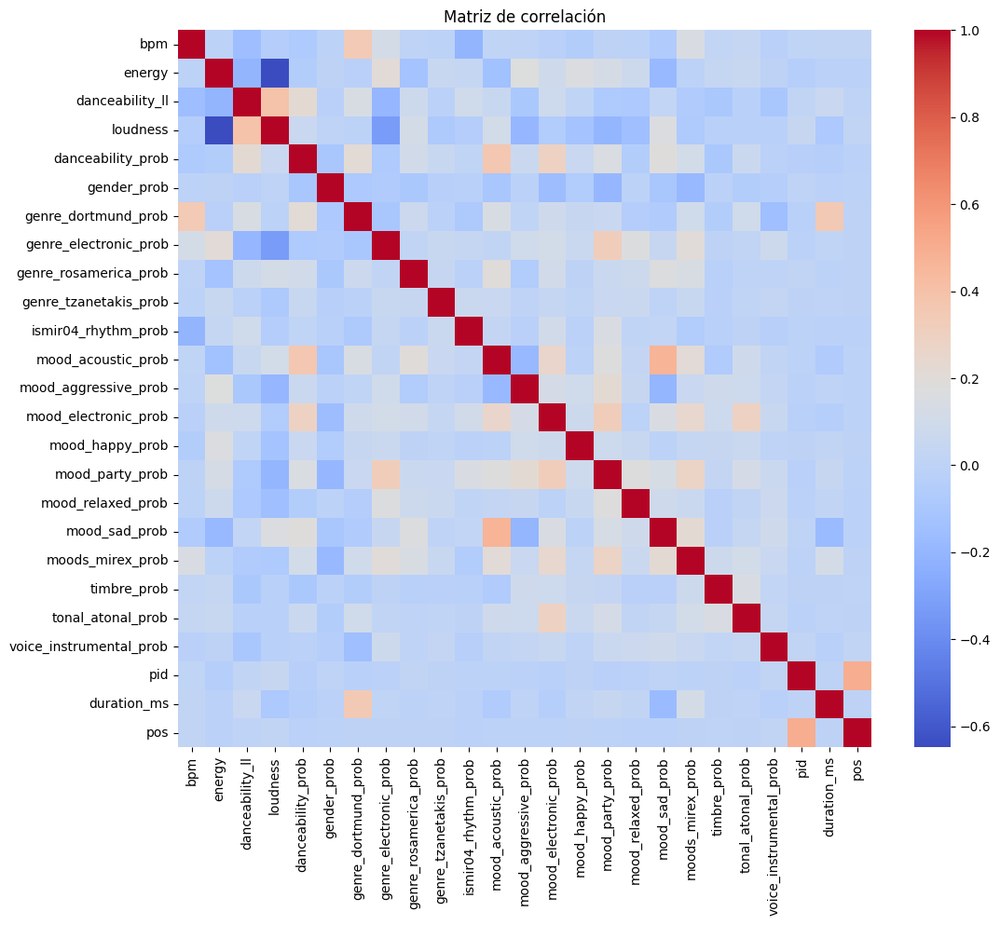

In [68]:
corr = sample_df[num_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=False, cmap='coolwarm')
plt.title("Matriz de correlación")
plt.show()

Para desplegar el resumen de todas las medidas al mismo tiempo. Si un atributo es nominal solo se despliega en top el valor mas frecuente y en unique el número de valores unicos.


**Tablas de Contingencia**: se usan para analizar variables categóricas. La tabla contiene las frecuencias marginales de todos los pares de valores entre dos variables categóricas.


In [36]:
categorical_cols = sample_df.select_dtypes(include=['object', 'category']).columns.tolist()
print("Columnas categóricas:")
print(categorical_cols)

Columnas categóricas:
['id', 'mbid', 'danceability_value', 'gender_value', 'genre_dortmund_value', 'genre_electronic_value', 'genre_rosamerica_value', 'genre_tzanetakis_value', 'ismir04_rhythm_value', 'mood_acoustic_value', 'mood_aggressive_value', 'mood_electronic_value', 'mood_happy_value', 'mood_party_value', 'mood_relaxed_value', 'mood_sad_value', 'moods_mirex_value', 'timbre_value', 'tonal_atonal_value', 'voice_instrumental_value', 'playlist_name', 'track_uri', 'track_name', 'artist_name', 'album_name']


In [37]:
sample_df[categorical_cols].nunique().sort_values(ascending=False)

id                          15147
track_uri                   15147
mbid                        14914
track_name                  13746
album_name                   8793
artist_name                  4898
playlist_name                3085
ismir04_rhythm_value           10
genre_tzanetakis_value          9
genre_rosamerica_value          8
genre_dortmund_value            7
genre_electronic_value          5
moods_mirex_value               5
danceability_value              2
gender_value                    2
mood_electronic_value           2
mood_acoustic_value             2
mood_sad_value                  2
mood_relaxed_value              2
mood_party_value                2
mood_happy_value                2
mood_aggressive_value           2
voice_instrumental_value        2
timbre_value                    2
tonal_atonal_value              2
dtype: int64

todo lo que tenga solo dos valores únicos se puede para a dummy

In [38]:
# vamos a eliminar las columnas se pueden usar para las tablas de contingencia porque tienen pocos valores únicos
# y no tienen sentido para el análisis
low_card_cols = [col for col in categorical_cols if sample_df[col].nunique(dropna=True) <= 20]

quiero saber si las relaciones son estadísticamente significativas con chi

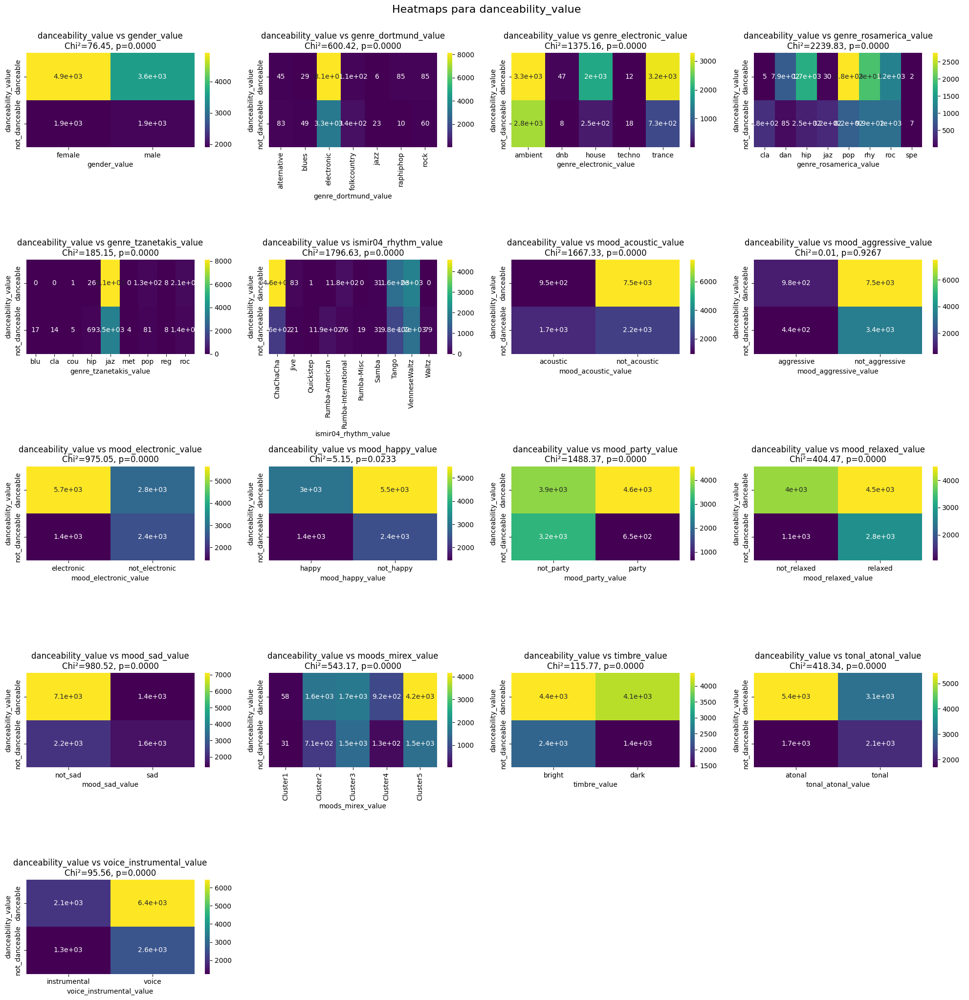

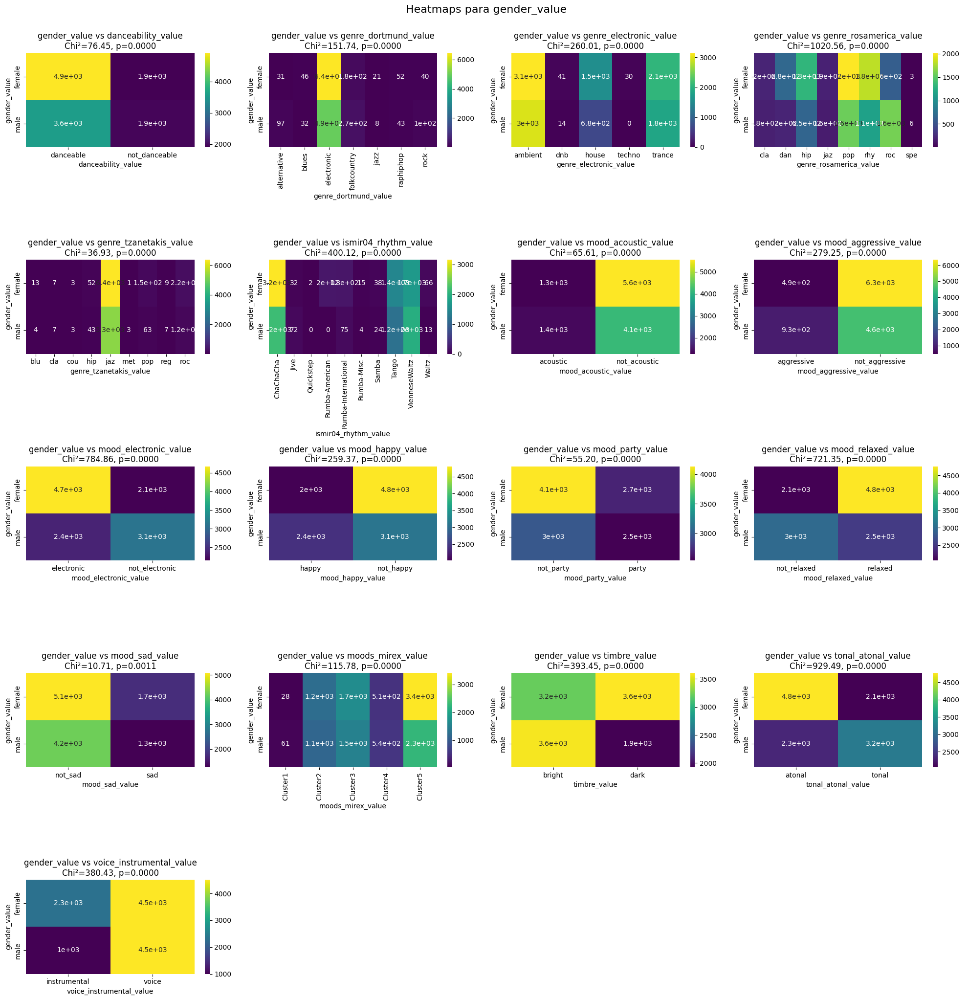

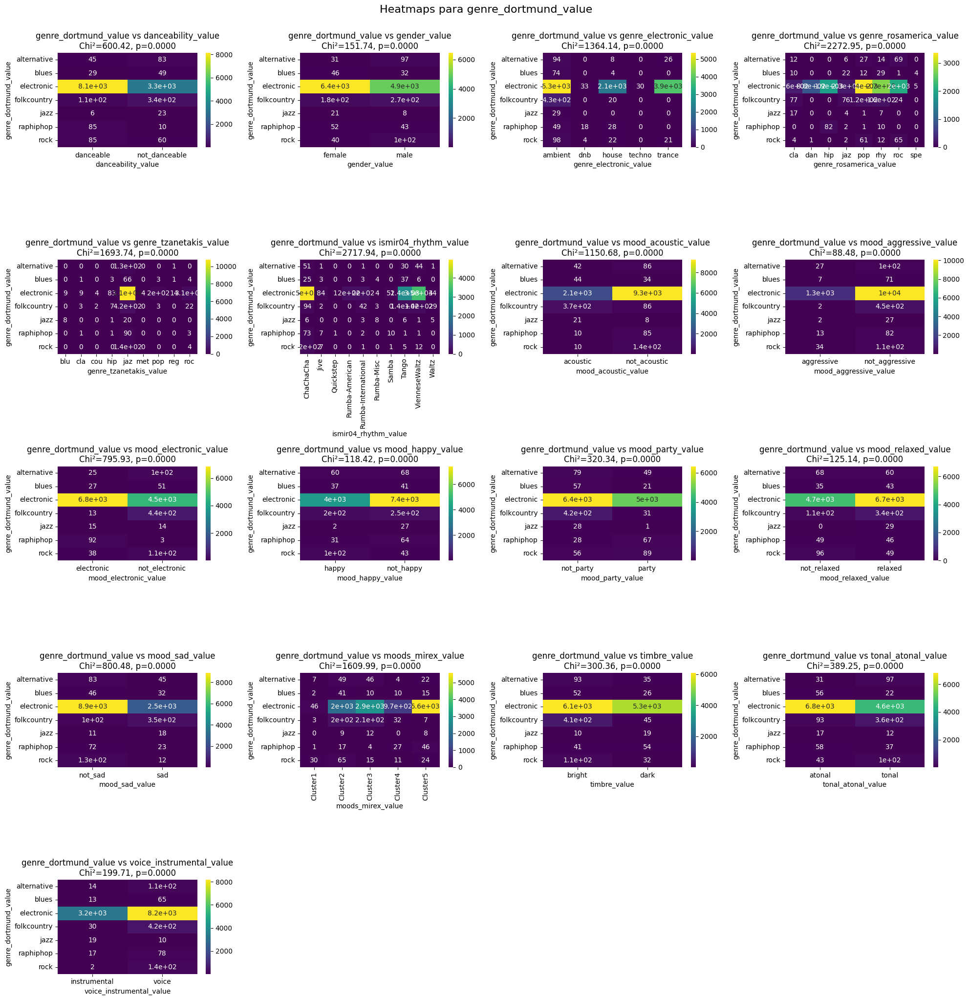

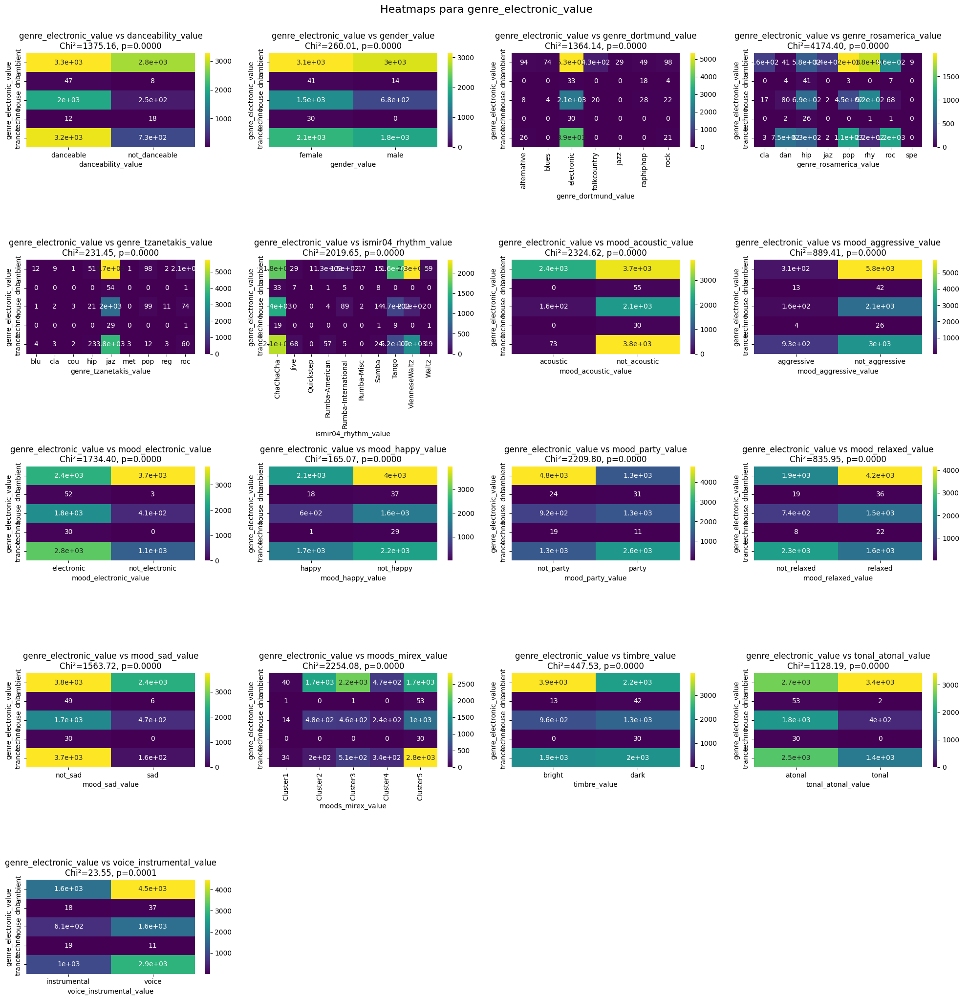

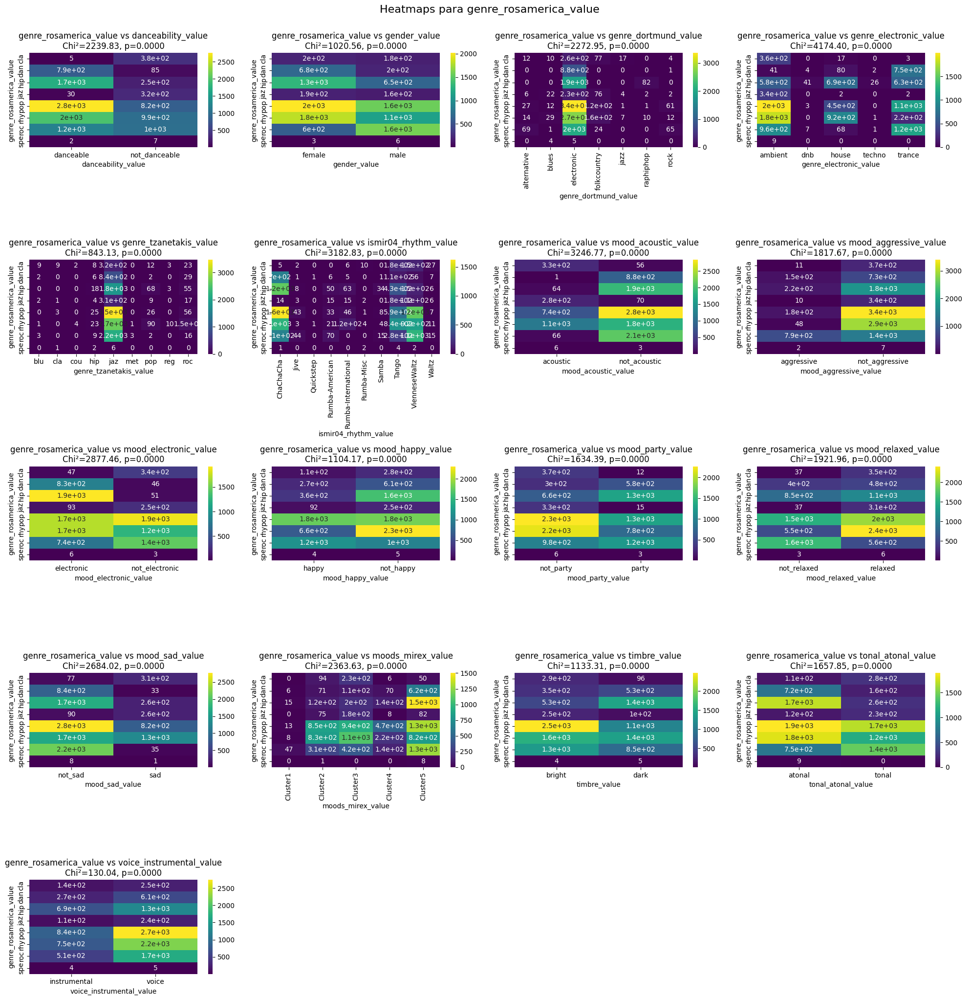

...

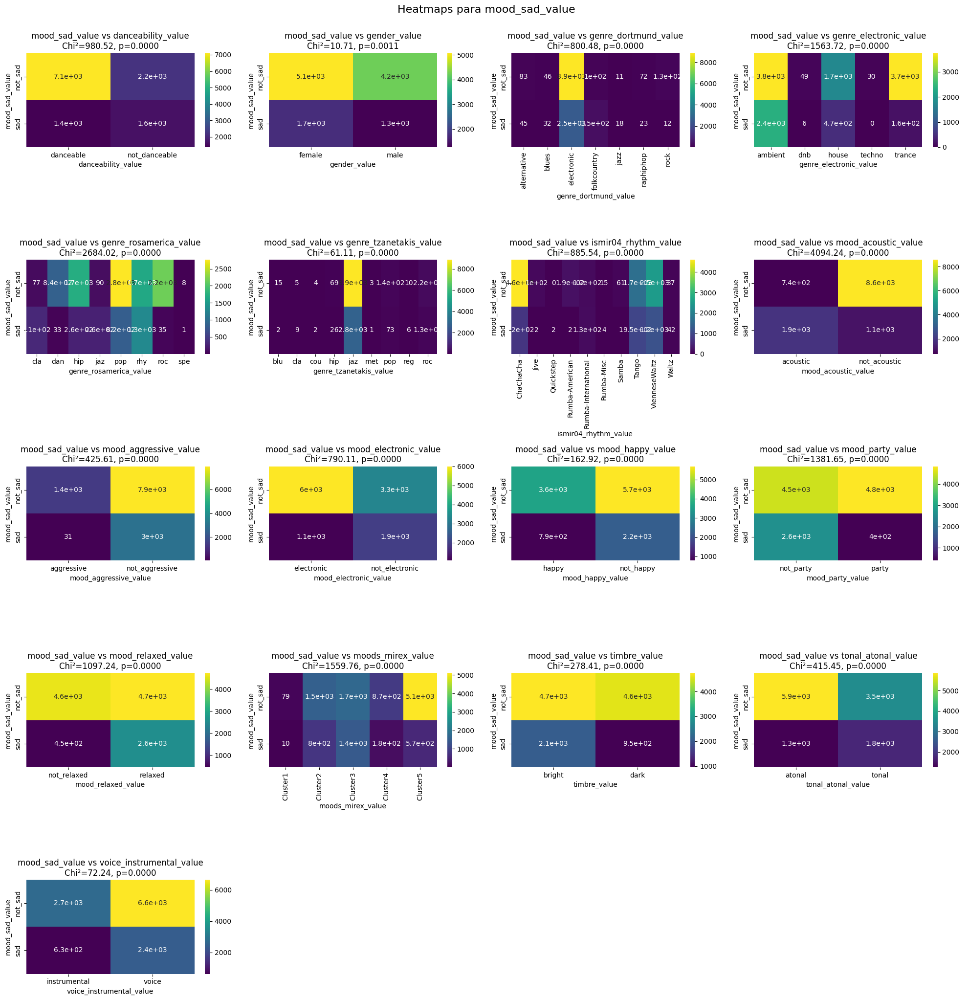

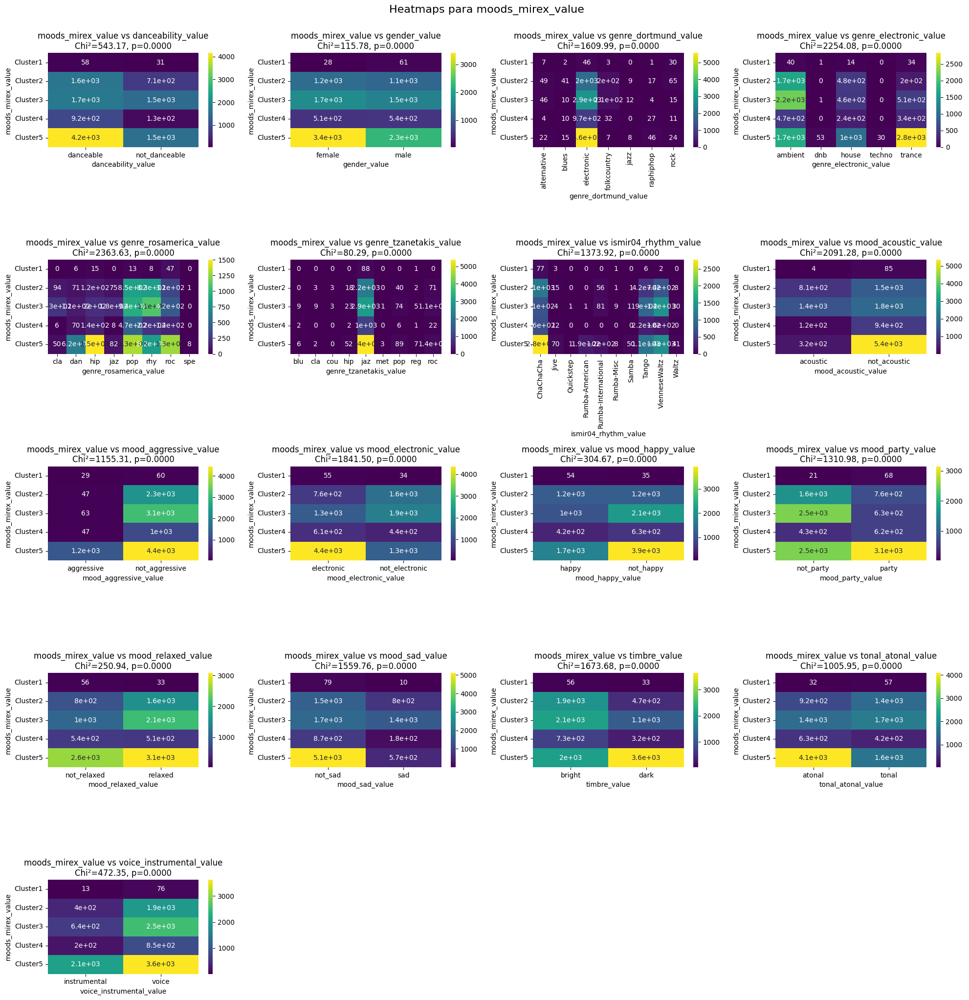

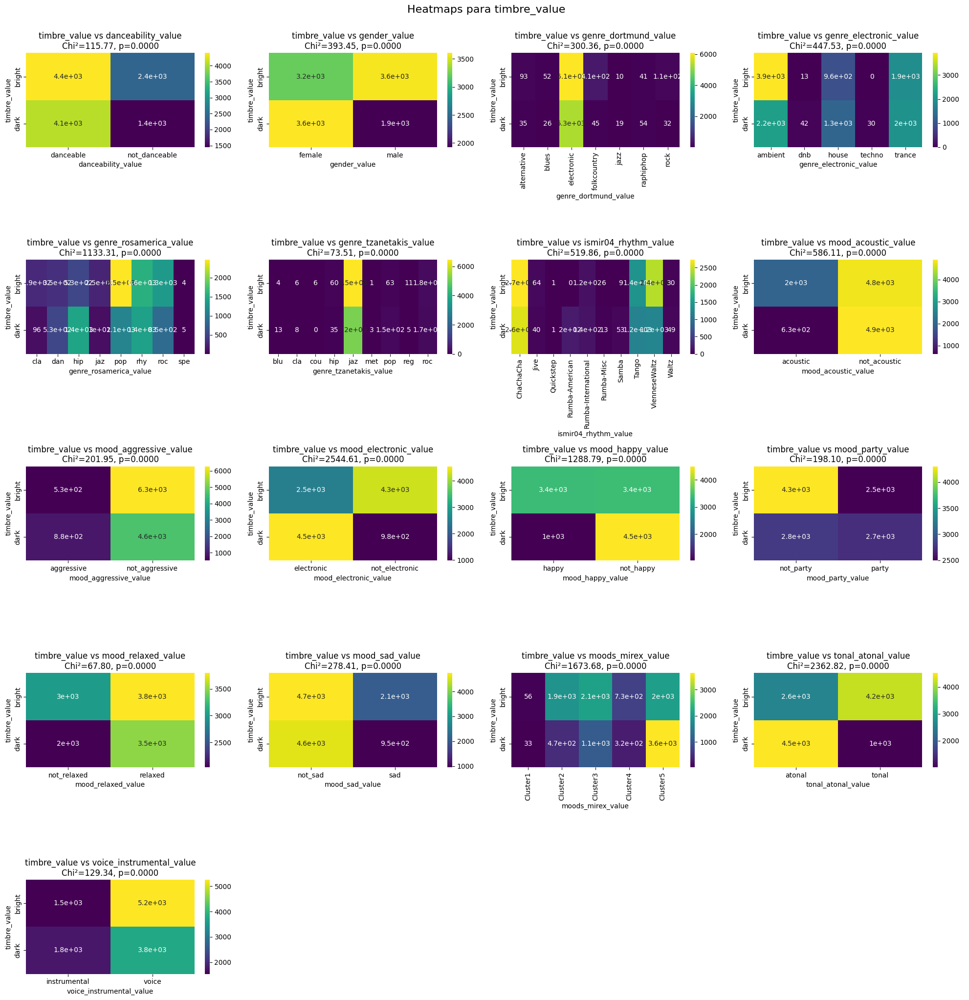

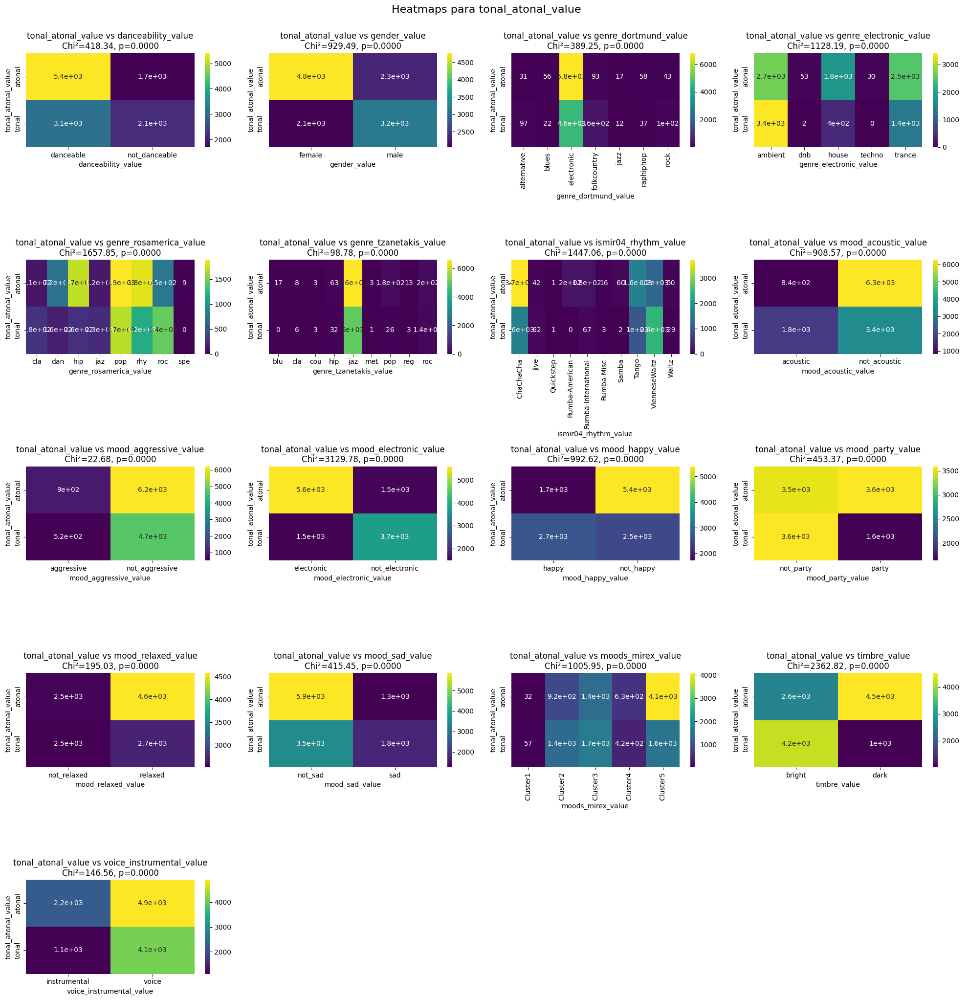

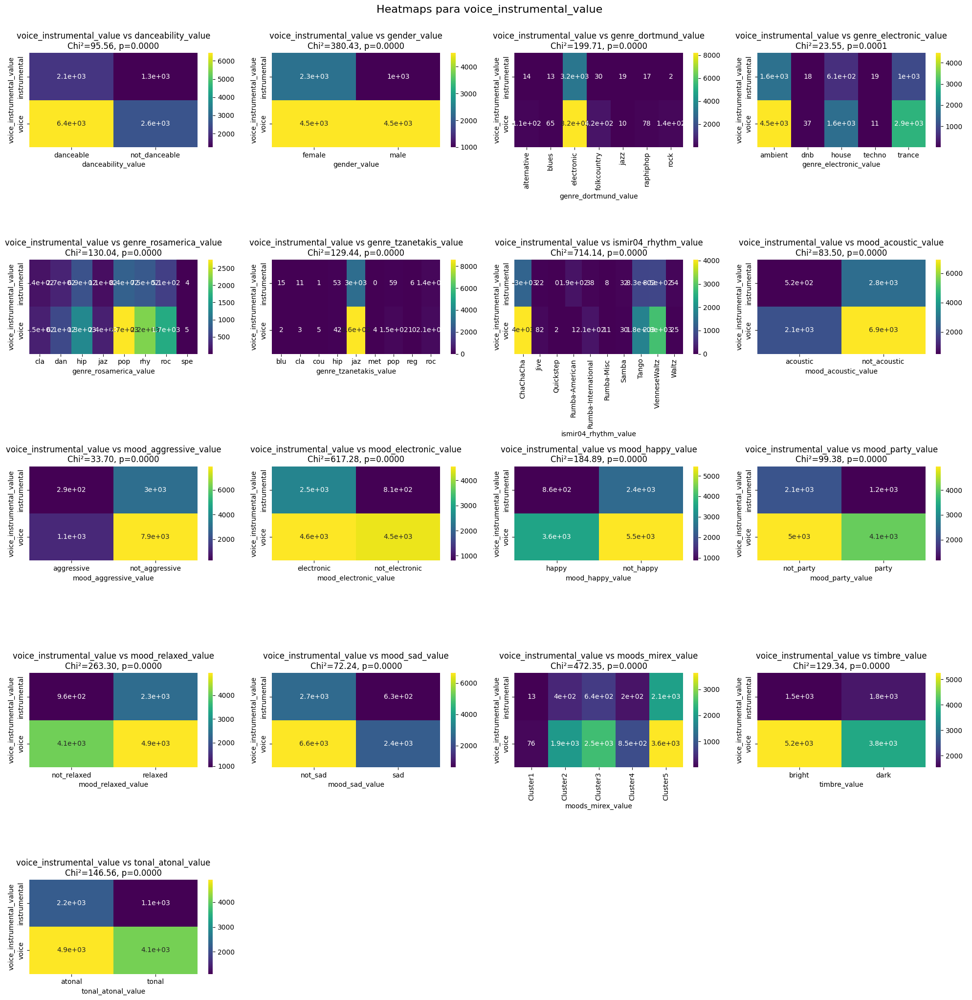

In [75]:

import math

non_nan_sample_df = sample_df.dropna(subset=low_card_cols)
contingency_tables = {}

cols_per_row = 4

for i, col1 in enumerate(low_card_cols):
    col2_combos = [col2 for col2 in low_card_cols if col2 != col1]
    total = len(col2_combos)
    rows = math.ceil(total / cols_per_row)

    fig, axes = plt.subplots(rows, cols_per_row, figsize=(cols_per_row * 5, rows * 4))
    axes = axes.flatten()  # Convertir a lista para indexar fácilmente

    for j, col2 in enumerate(col2_combos):
        try:
            table = pd.crosstab(
                non_nan_sample_df[col1].fillna("Missing").astype(str),
                non_nan_sample_df[col2].fillna("Missing").astype(str)
            )

            chi2, p, dof, expected = chi2_contingency(table)
            contingency_tables[(col1, col2)] = table

            sns.heatmap(table, annot=True, cmap='viridis', ax=axes[j])
            axes[j].set_title(f"{col1} vs {col2}\nChi²={chi2:.2f}, p={p:.4f}")
            axes[j].set_xlabel(col2)
            axes[j].set_ylabel(col1)

        except Exception as e:
            print(f"Error processing ({col1}, {col2}): {e}")
            axes[j].axis("off")  # Si falla, apagar el eje

    # Apagar cualquier subplot sobrante
    for k in range(j+1, len(axes)):
        axes[k].axis("off")

    plt.tight_layout()
    plt.suptitle(f"Heatmaps para {col1}", fontsize=16, y=1.02)
    plt.show()


## **Histogramas**

*   Gráfica de la distribucion de los valores de una variable.
*   Los valores se dividen en bins y se crea una gráfica de barra por cada bin.
*   La altura de cada barra indica el numero de elementos o frecuencia del bin.

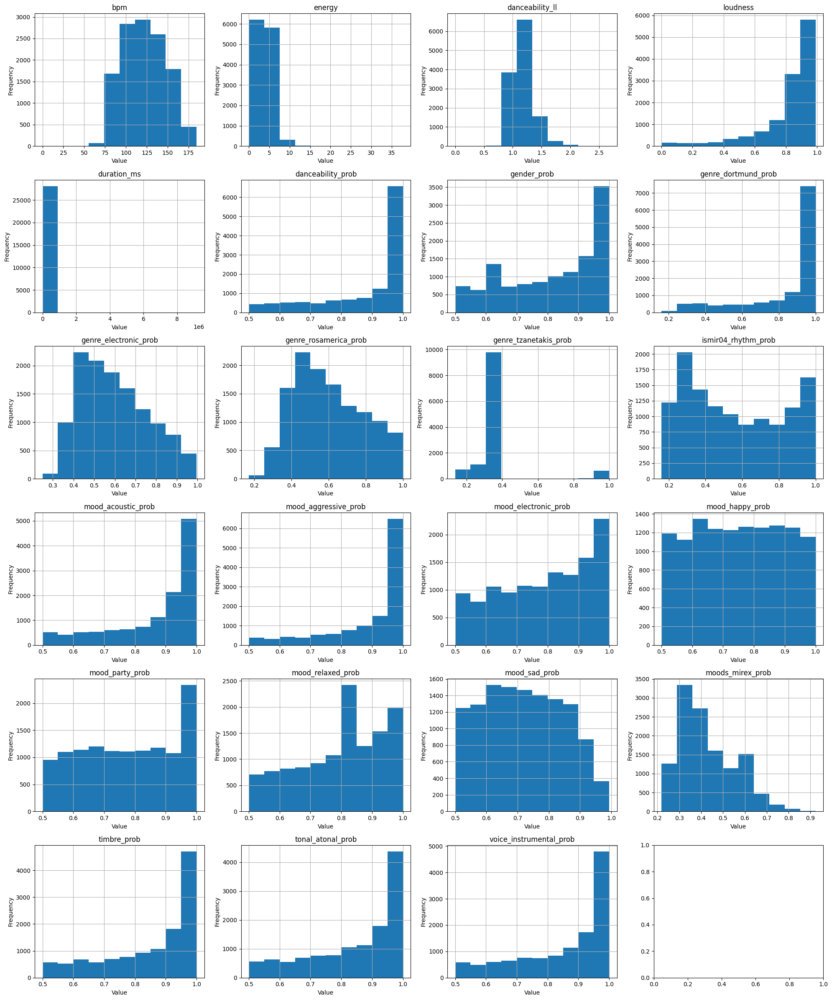

In [56]:
import math
# Número de columnas por fila
cols_per_row = 4

# Número total de columnas numéricas
num = len(num_cols)

# Número de filas necesarias
rows = math.ceil(num / cols_per_row)

# Crear figura y ejes
fig, axes = plt.subplots(rows, cols_per_row, figsize=(cols_per_row * 5, rows * 4))
axes = axes.flatten()  # Aplanar la matriz de ejes para acceso fácilch axis
for i, col in enumerate(num_cols):
    sample_df[col].hist(ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()


## **Estimación de densidad**


*   Otra forma de visualizar los datos.
*   Se usan técnicas estadísticas no paramétricas: estimación de densidad de **kernel**.
*   Versión suavizada del histograma, permite determinar si los datos observados se comportan como una densidad conocida.

En R se crea con el comando `density`, y se visualiza con el comando `plot`

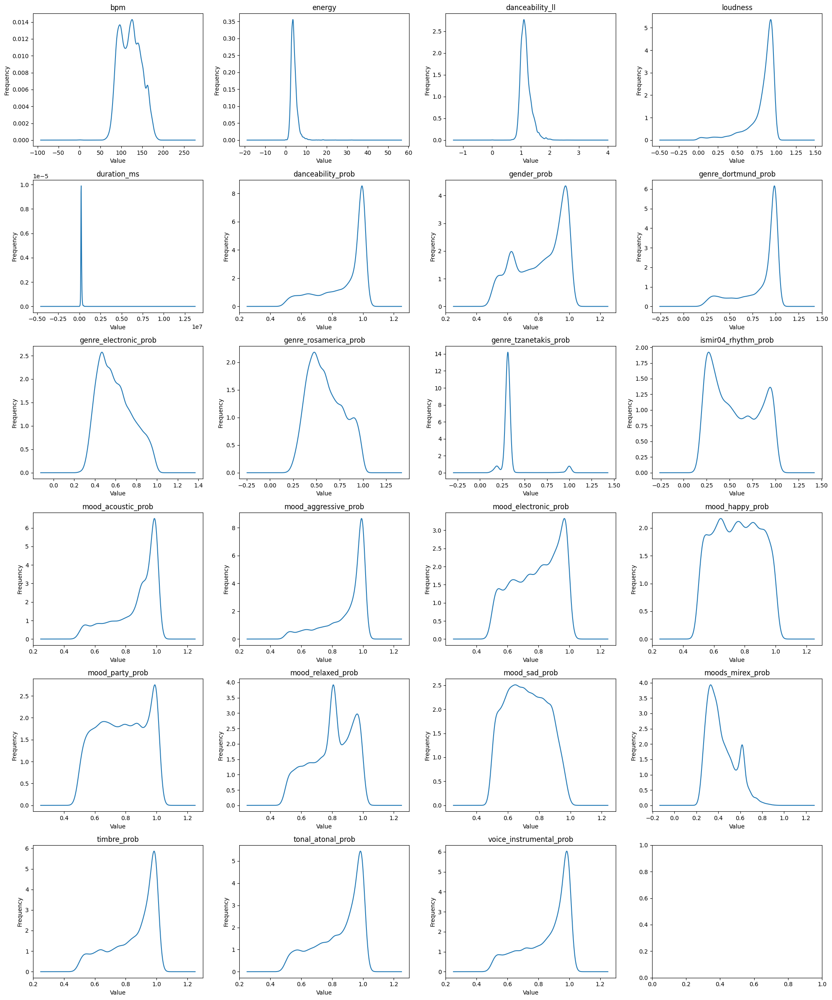

In [57]:
# Número total de columnas numéricas
num = len(num_cols)

# Número de filas necesarias
rows = math.ceil(num / cols_per_row)

# Crear figura y ejes
fig, axes = plt.subplots(rows, cols_per_row, figsize=(cols_per_row * 5, rows * 4))
axes = axes.flatten()  # Aplanar la matriz de ejes para acceso fácilch axis

# Iterate through the numeric columns and plot a histogram on each axis
for i, col in enumerate(num_cols):
    sample_df[col].plot.kde(ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()


Hay muchas variables con distribuciones asimétricas, se recomendaría:

* Escalar, normalizar o transformar.
* Tratar outliers.

Muchas probabilidades están sesgadas hacia 0 o 1, indicando clasificaciones muy marcadas.

## **Diagramas de caja**

Se construyen a partir de los percentiles


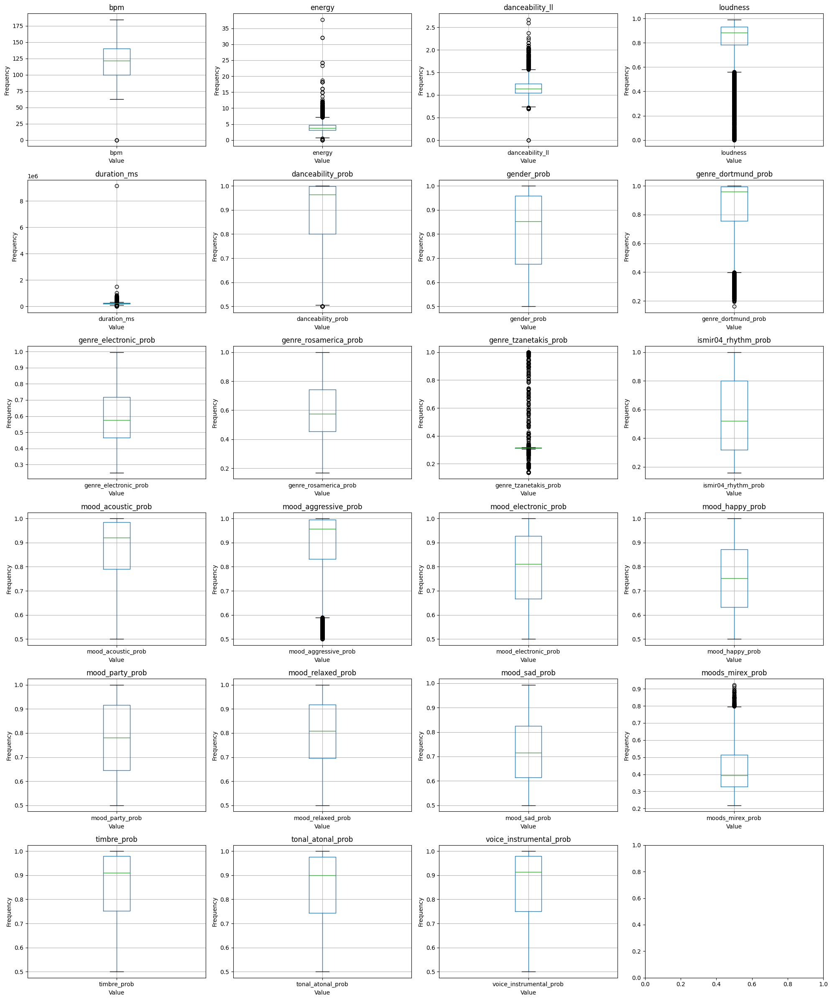

In [62]:
# Número total de columnas numéricas
num = len(num_cols)

# Número de filas necesarias
rows = math.ceil(num / cols_per_row)

# Crear figura y ejes
fig, axes = plt.subplots(rows, cols_per_row, figsize=(cols_per_row * 5, rows * 4))
axes = axes.flatten()  # Aplanar la matriz de ejes para acceso fácilch axis


# Iterate through the numeric columns and plot a histogram on each axis
for i, col in enumerate(num_cols):
    sample_df.boxplot(column=col, ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()


energy tiene una mediana baja, con muchos outliers altos.

mood_aggressive_prob tiene la mayoría de valores cercanos a 1, pero también outliers bajos.

## **Diagramas de dispersión**

*    Los diagramas de dispersion o **scatter plots** usan coordenadas cartesianas para mostrar los valores de dos variables del mismo largo.
*    los scatter plots que haremos están basados en las correlaciones que se han visto 
danceability_ll vs danceability_prob 
energy vs loudness 
bpm vs energy 
mood_party_prob vs danceability_prob 
mood_relaxed_prob vs mood_sad_prob 
voice_instrumental_prob vs energy



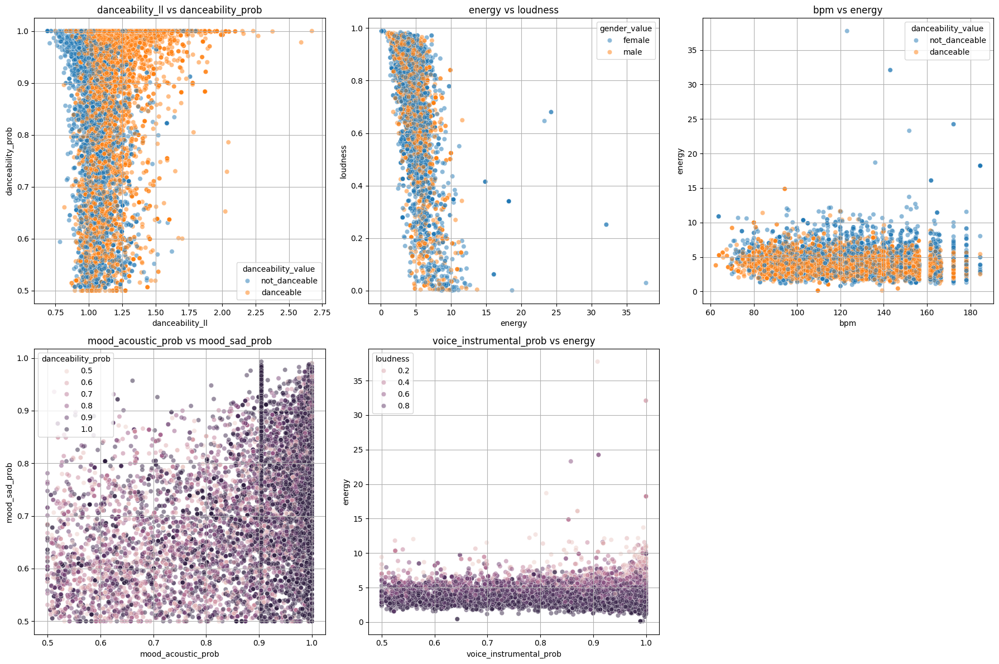

In [135]:
scatter_pairs = [
    ('danceability_ll', 'danceability_prob', 'danceability_value'),
    ('energy', 'loudness','gender_value'),
    ('bpm', 'energy' ,'danceability_value'),
    ('mood_acoustic_prob', 'mood_sad_prob', 'danceability_prob'),
    ('voice_instrumental_prob', 'energy', 'loudness')
]

plt.figure(figsize=(18, 12))
for i, (x, y, hue) in enumerate(scatter_pairs, 1):
    plt.subplot(2, 3, i)
    sns.scatterplot(data=sample_df, x=x, y=y, alpha=0.5, hue=hue)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f"{x} vs {y}")
    plt.grid(True)
plt.tight_layout()
plt.show()

## **Coordenadas Paralelas**

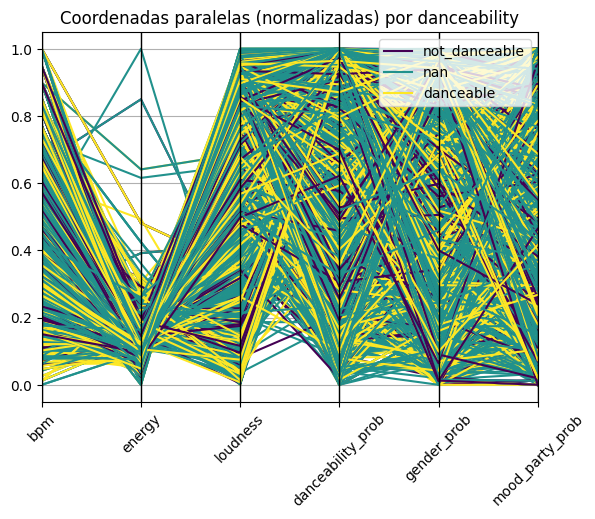

In [140]:

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(sample_df[num_cols])

# Crear un nuevo DataFrame con los datos escalados
scaled_df = pd.DataFrame(scaled_data, columns=num_cols)

# (Opcional) Si quieres juntar los datos categóricos originales
final_df = pd.concat([scaled_df, sample_df[categorical_cols].reset_index(drop=True)], axis=1).dropna()

cols = ['bpm', 'energy', 'loudness', 'danceability_prob', 'gender_prob', 'mood_party_prob']
df_subset = final_df[cols + ['danceability_value']]

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_subset[cols])

final_df = pd.DataFrame(scaled_data, columns=cols)
final_df['danceability_value'] = df_subset['danceability_value']

parallel_coordinates(final_df, 'danceability_value', colormap=plt.cm.viridis)
plt.title("Coordenadas paralelas (normalizadas) por danceability")
plt.xticks(rotation=45)
plt.show()


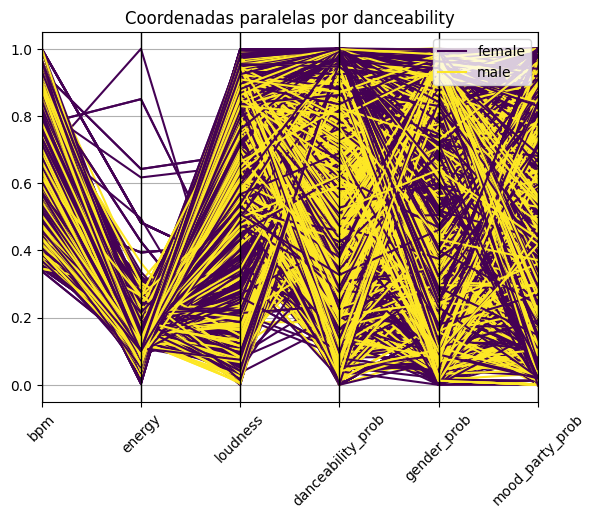

In [139]:
cols = ['bpm', 'energy', 'loudness', 'danceability_prob', 'gender_prob', 'mood_party_prob']
df_par = final_df[cols + ['gender_value']].dropna()

# Graficamos
parallel_coordinates(df_par, 'gender_value', colormap=plt.cm.viridis)
plt.title("Coordenadas paralelas por danceability")
plt.xticks(rotation=45)
plt.show()

---
**REFERENCIAS**

*   Documentación  de Pandas. https://pandas.pydata.org/
*   Documentación de matplotlib. https://matplotlib.org/
*   Bravo, F. (2013). Análisis exploratorio en R
*   Diapositivas clase
*   Lichman, M. (2013). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. Irvine, CA: University of California, School of Information and Computer Science.

---





